In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns

In [2]:
df = pd.read_csv("data/EMEWS_cleaned_with_nan.csv")

In [3]:
df.shape

(599, 22)

In [4]:
df.columns

Index(['day', 'date', 'total_number_of_patients', 'total_number_of_emews',
       'zone_a_mwr_patients', 'zone_a_mwr_cat_3', 'zone_a_mwr_cat_4',
       'zone_a_mwr_sets_of_emews', 'zone_a_mwr_deescalations',
       'zone_a_mwr_escalations', 'zone_a__patients', 'zone_a__cat_2',
       'zone_a__cat_3', 'zone_a__sets_of_emews', 'zone_a__deescalations',
       'zone_a__escalations', 'zone_b/c_patients', 'zone_b/c_cat_2',
       'zone_b/c_cat_3', 'zone_b/c_sets_of_emews', 'zone_b/c_deescalations',
       'zone_b/c_escalations'],
      dtype='object')

In [5]:
df_numeric = df.select_dtypes(include='number')

In [6]:
def histogram_plot(y, ax, color):
    sns.histplot(y, ax=ax, kde=True, color=color)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

def box_plot(y, ax, color):
    sns.boxplot(y=y, ax=ax, color=color)
    ax.set_xlabel('Value')
    ax.set_ylabel('')

def violin_plot(y, ax, color):
    sns.violinplot(y=y, ax=ax, color=color, inner='box')  # inner='box' shows embedded boxplot
    ax.set_ylabel('Value')
    ax.set_xlabel('')

def time_series_plot(y, ax, color):
    sns.lineplot(x=df['date'], y=y, ax=ax, color=color)
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')

In [7]:
def plot_multiple_plots(df, plot_func, title, cols_per_row=3, figsize_per_plot=(5,4), color='tab:blue'):
    cols = df.columns
    n_cols = cols_per_row
    n_rows = math.ceil(len(cols) / n_cols)
    figsize = (figsize_per_plot[0] * n_cols, figsize_per_plot[1] * n_rows)
    _, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    sns.set_style("whitegrid")  # set once before plotting

    for i, col in enumerate(cols):
        plot_func(y=df[col], ax=axes[i], color=color)
        axes[i].set_title(col, fontsize=10)
        axes[i].tick_params(axis='both', labelsize=8)
        axes[i].grid(True)

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

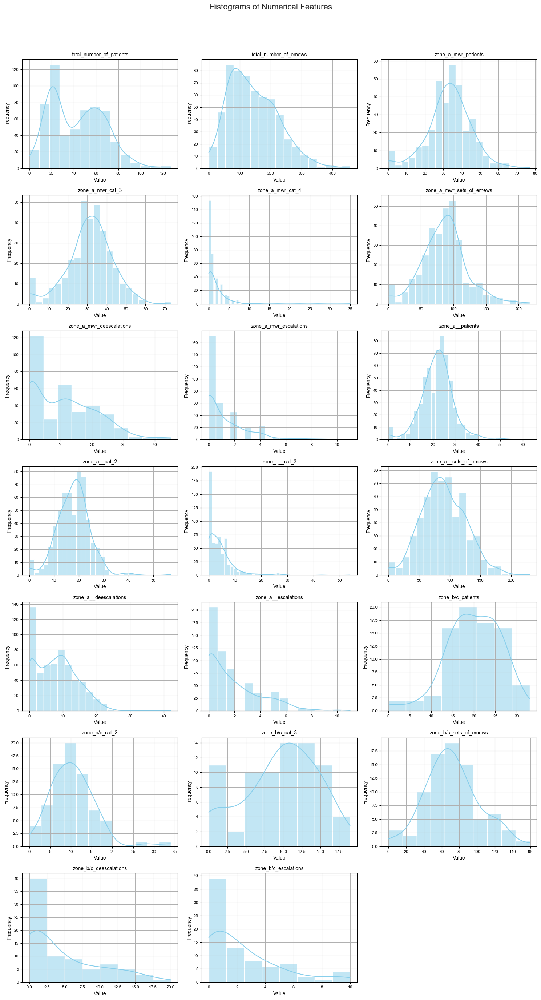

In [8]:
plot_multiple_plots(
    df_numeric,
    plot_func=histogram_plot,
    title="Histograms of Numerical Features",
    color='skyblue'
)

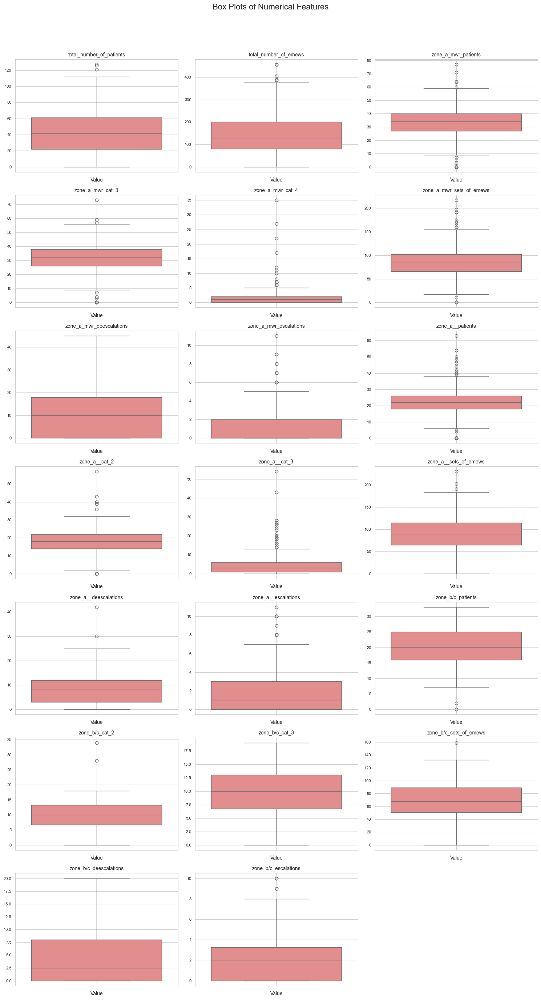

In [9]:

plot_multiple_plots(
    df_numeric,
    plot_func=box_plot,
    title="Box Plots of Numerical Features",
    color='lightcoral'
)

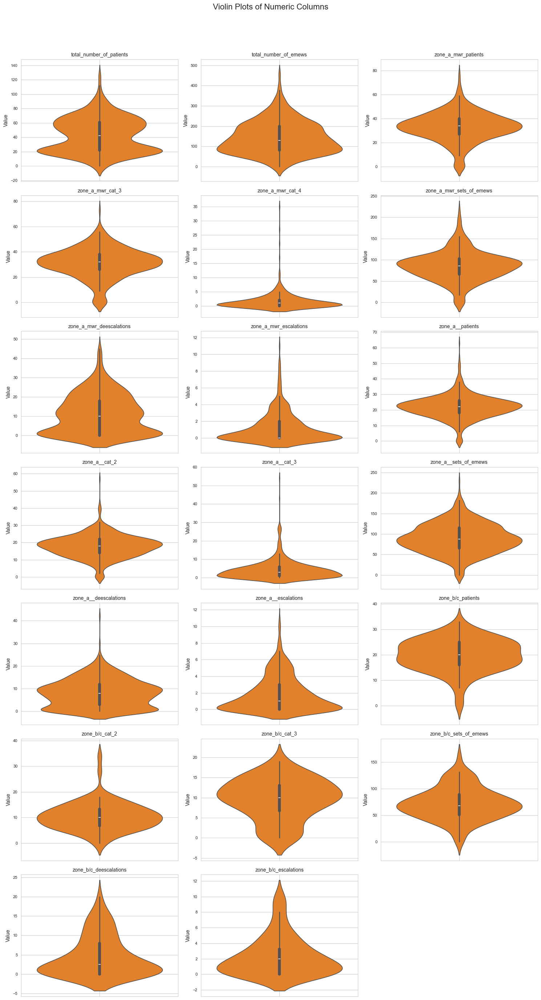

In [10]:
# Box & Violin Plots
plot_multiple_plots(df_numeric, violin_plot, "Violin Plots of Numeric Columns", color='tab:orange')

In [11]:
def plot_one_vs_all(df, cols_per_row=3, figsize_per_plot=(5, 4)):
    numeric_cols = df.select_dtypes(include='number').columns
    sns.set(style="whitegrid")

    for target_col in numeric_cols:
        other_cols = [col for col in numeric_cols if col != target_col]
        n = len(other_cols)
        n_cols = cols_per_row
        n_rows = math.ceil(n / n_cols)
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize_per_plot[0] * n_cols, figsize_per_plot[1] * n_rows))
        axes = axes.flatten()

        for i, col in enumerate(other_cols):
            sns.scatterplot(x=df[col], y=df[target_col], ax=axes[i], s=15, alpha=0.7)
            axes[i].set_title(f'{target_col} vs {col}', fontsize=9)
            axes[i].set_xlabel(col)
            axes[i].set_ylabel(target_col)

        # Hide unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.suptitle(f'{target_col} vs All Other Features', fontsize=14, y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()

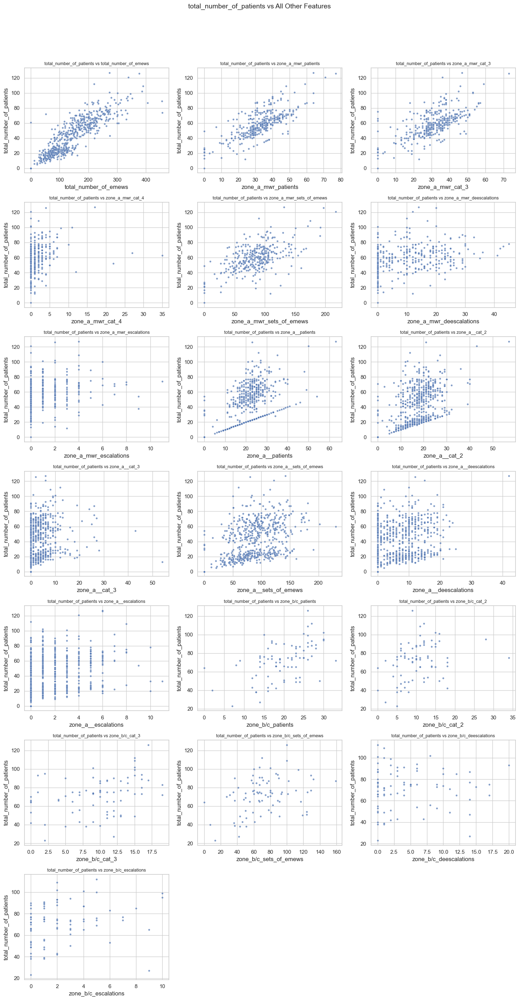

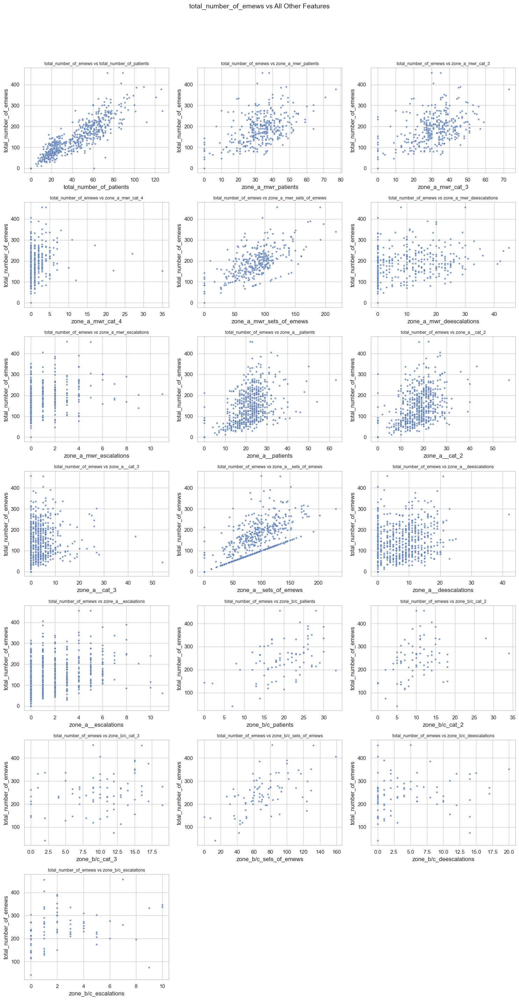

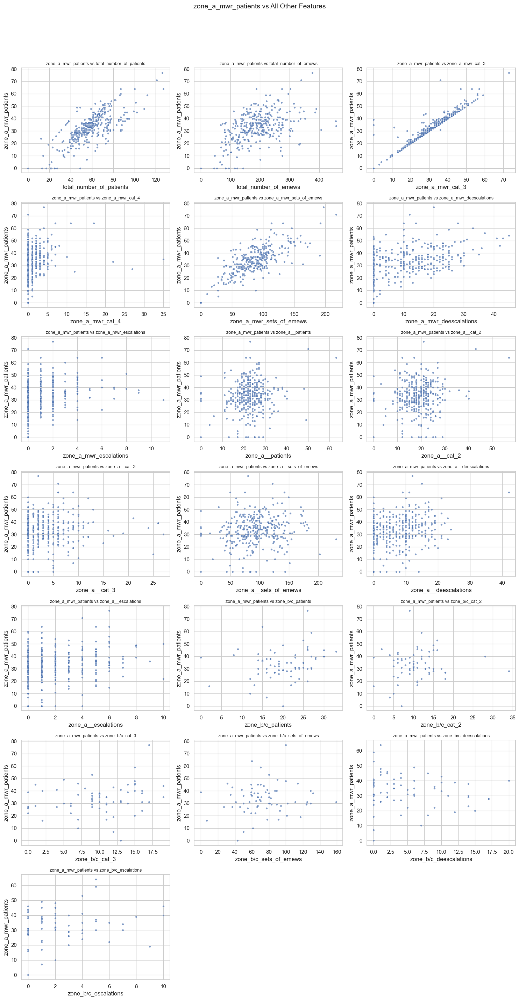

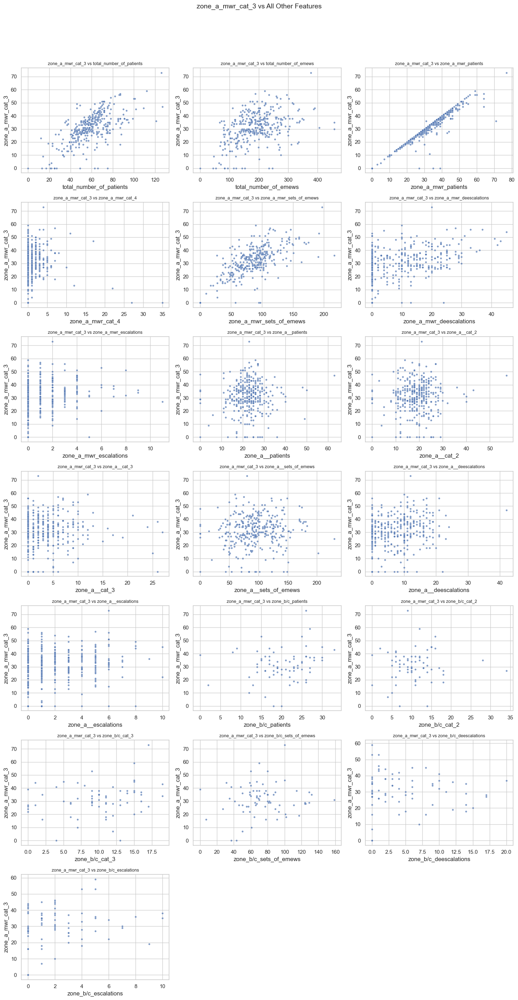

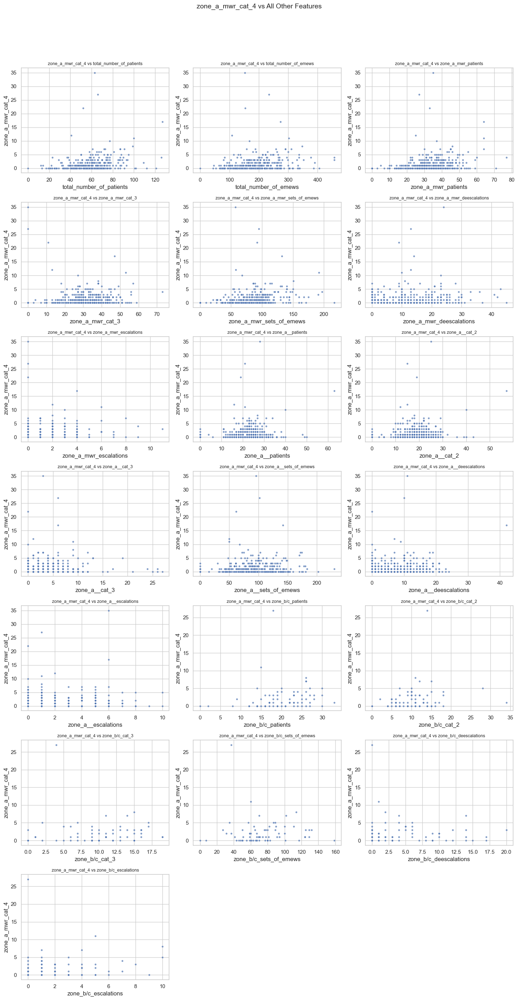

...

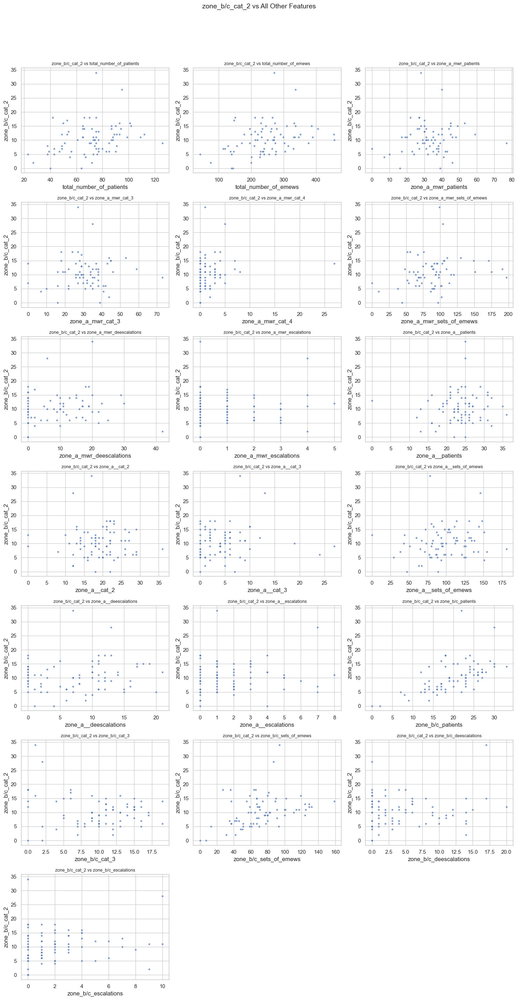

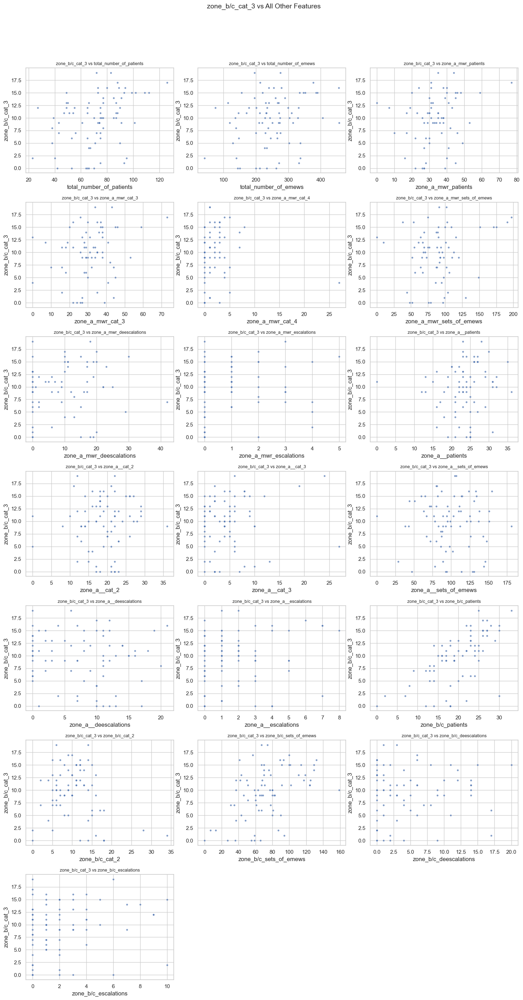

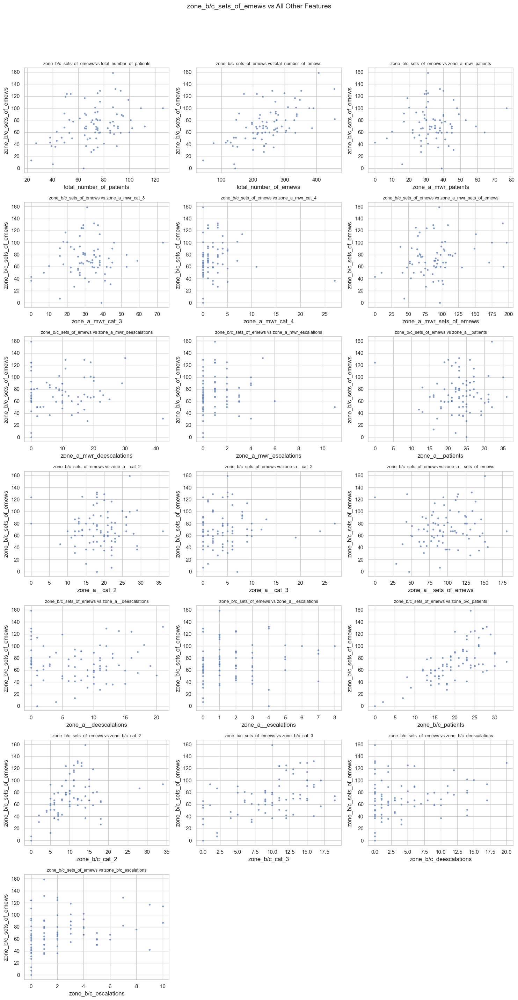

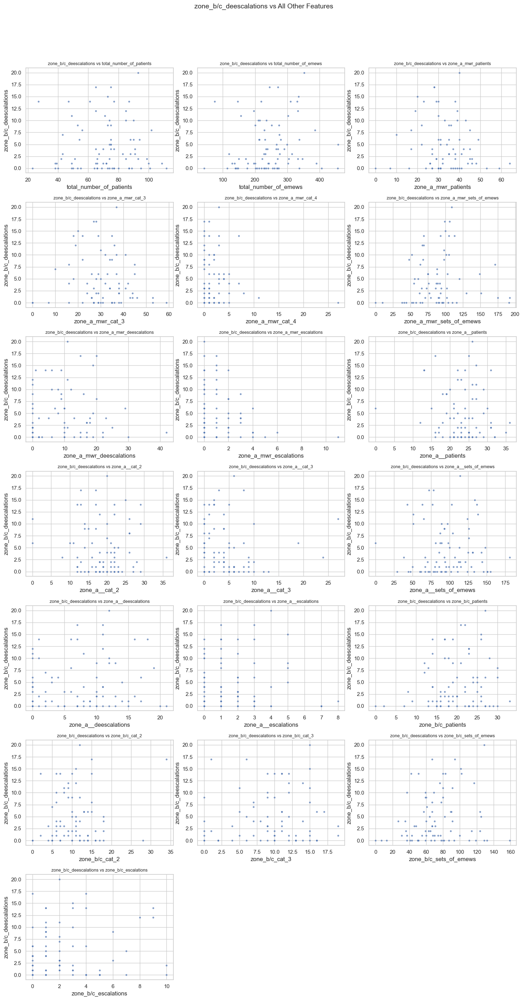

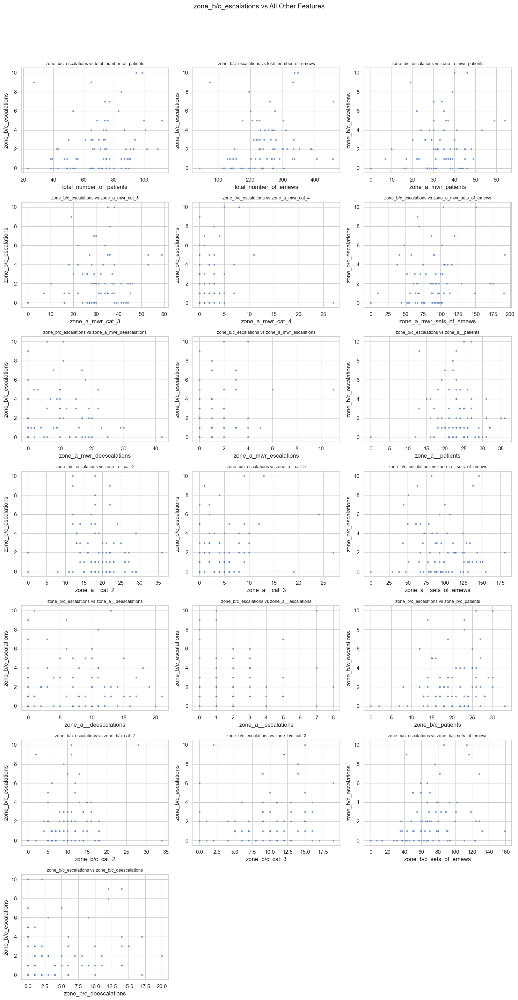

In [12]:
plot_one_vs_all(df_numeric, cols_per_row=3)

In [13]:
df_numeric.columns

Index(['total_number_of_patients', 'total_number_of_emews',
       'zone_a_mwr_patients', 'zone_a_mwr_cat_3', 'zone_a_mwr_cat_4',
       'zone_a_mwr_sets_of_emews', 'zone_a_mwr_deescalations',
       'zone_a_mwr_escalations', 'zone_a__patients', 'zone_a__cat_2',
       'zone_a__cat_3', 'zone_a__sets_of_emews', 'zone_a__deescalations',
       'zone_a__escalations', 'zone_b/c_patients', 'zone_b/c_cat_2',
       'zone_b/c_cat_3', 'zone_b/c_sets_of_emews', 'zone_b/c_deescalations',
       'zone_b/c_escalations'],
      dtype='object')

In [14]:
target = 'total_number_of_patients'
features = df_numeric.drop(columns=[target]).columns.tolist()

# Clean data
X = df_numeric[features].dropna()
y = df_numeric[target].loc[X.index]

model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X, y)

# Get feature importances
feature_importances = pd.Series(model.feature_importances_, index=features)
top_features = feature_importances.sort_values(ascending=False).head(6).index.tolist()

# Plot PDPs for top features
fig, ax = plt.subplots(figsize=(15, 8))
display = PartialDependenceDisplay.from_estimator(
    model, X, top_features,
    grid_resolution=100, ax=ax, kind='average'
)
plt.suptitle("Partial Dependence Plots for Top 5 Features", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


NameError: name 'RandomForestRegressor' is not defined

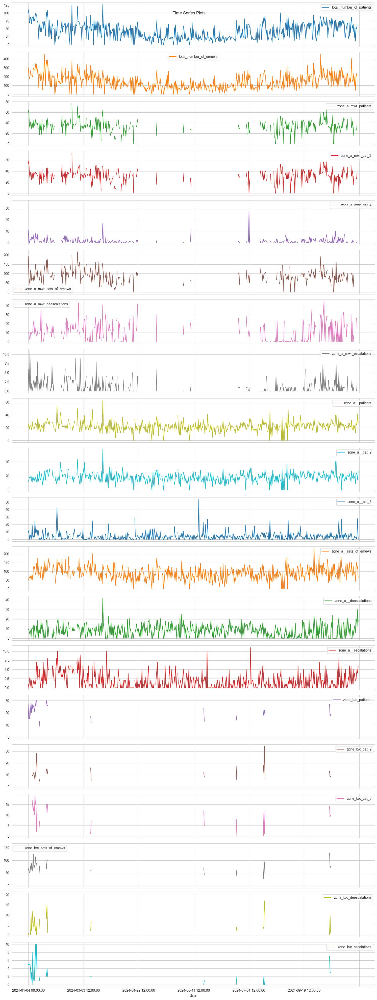

In [ ]:
df_time = df.set_index('date').sort_index()
df_time[df_numeric.columns].plot(subplots=True, figsize=(15, len(df_numeric.columns) * 2), title='Time Series Plots')
plt.tight_layout()
plt.show()

## Heatmap

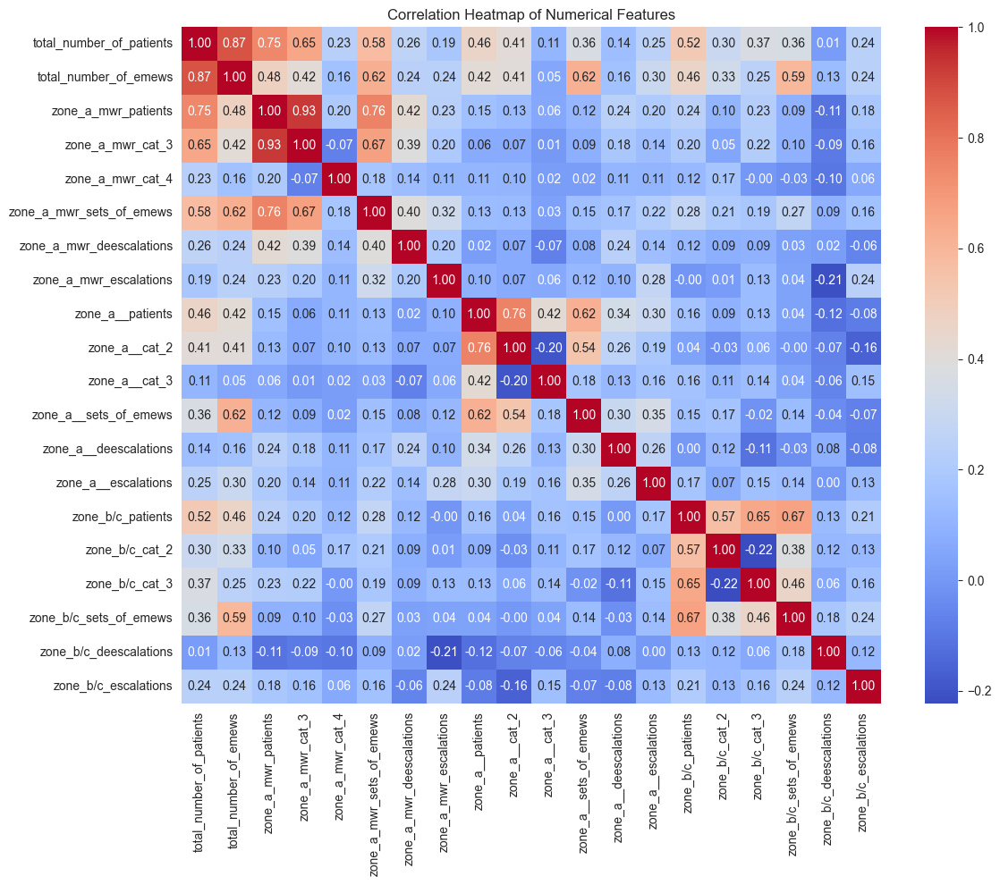

In [ ]:
corr_matrix = df_numeric.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')

plt.title("Correlation Heatmap of Numerical Features")
plt.tight_layout()
plt.show()